# Examine RadarSAT2 Archive for a PNW Cascade volcanoes

Last update: 9/15/2019


In [1]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.dates import YearLocator, MonthLocator, DateFormatter
from pandas.plotting import table
import matplotlib.dates as mdates

import holoviews as hv
import hvplot.xarray
import hvplot.pandas
import geoviews as gv

%matplotlib inline

In [2]:
vectorFile = './washington-conus.geojson'

In [13]:
gf = gpd.read_file(vectorFile)
#gf = gpd.GeoDataFrame(gf['geometry'])
gf

,name,area,perimeter,geometry
0,Silver Glaicer,4.535315,11.002262,POLYGON ((-121.6531537142911 44.06287339899803...


In [16]:
# Plot search AOI and frames on a map using Holoviz Libraries
aoi = gf.hvplot(geo=True, line_color='b', fill_color=None, fill_alpha=0)
#tiles = gv.tile_sources.CartoEco.options(width=700, height=500) 
tiles = gv.tile_sources.StamenTerrainRetina.options(width=700, height=500) 
labels = gv.tile_sources.StamenLabels.options(level='annotation')
tiles * aoi

:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]   (name,area,perimeter)

In [39]:
gf = gpd.read_file('./search_conus_2019.geojson')
gf.head()

,Name,description,tessellate,extrude,visibility,geometry
0,2019-08-15T14:16:16,\nGeoCenter Feature ID: 8401d48a-dd6d-40fd-8ca...,-1,0,-1,POLYGON Z ((-121.8714858064034 49.592458560755...
1,2019-07-29T02:02:09,\nGeoCenter Feature ID: b0423d32-0f11-416d-9d9...,-1,0,-1,POLYGON Z ((-122.3002570760752 44.534870338828...
2,2019-07-12T14:09:17,\nGeoCenter Feature ID: 6fc706d5-01a7-4857-b39...,-1,0,-1,POLYGON Z ((-122.1609809484925 44.934850121900...
3,2019-06-11T02:02:13,\nGeoCenter Feature ID: b8b35e12-3ec2-4415-a73...,-1,0,-1,POLYGON Z ((-122.3018052937215 44.534020253765...
4,2019-05-25T14:09:19,\nGeoCenter Feature ID: 1b6e3c10-5bf7-4254-b25...,-1,0,-1,POLYGON Z ((-122.1573042302724 44.933529386804...


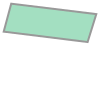

In [40]:
gf.Name.iloc[0]
gf.geometry.iloc[0]

In [41]:
# function to split description into columns

#test = gf.description.iloc[0]
kml2dict = {}
for i,entry in gf.iterrows():
    lines = entry.description.strip('\n').split('\n')
    attr = {}
    attr['Name'] = entry.Name
    attr['geometry'] = entry.geometry
    for line in lines:
        #print(line)
        k,v = line.split(': ')
        attr[k] = v

    
    kml2dict[i] = attr

In [42]:
gf = gpd.GeoDataFrame(kml2dict)
gf = gf.transpose()
gf['Path'] = gf['Relative Orbit Number'].astype(float).apply(int)
gf['Date'] = gf.Name.str[:10]
gf.head()

,Name,geometry,GeoCenter Feature ID,Beam Mode,Beam Position,Polarization,Acquisition Start Time,Acquisition End Time,Swath Direction,Absolute Orbit Number,Relative Orbit Number,Incidence Angle,Spacecraft Orientation,Image ID,Scene Number,Path,Date
0,2019-08-15T14:16:16,POLYGON Z ((-121.8714858064034 49.592458560755...,8401d48a-dd6d-40fd-8ca1-5115d46798b2,Wide,W2,VV+VH,2019-08-15T14:16:16.694Z,2019-08-15T14:16:28.141Z,Descending,60911.36357,307.36357,35.179813,RIGHT,749372,1,307,2019-08-15
1,2019-07-29T02:02:09,POLYGON Z ((-122.3002570760752 44.534870338828...,b0423d32-0f11-416d-9d92-e5d521435c1d,Extra Fine,XF0W3,HH,2019-07-29T02:02:09.527Z,2019-07-29T02:02:28.400Z,Ascending,60661.11904,57.11904,41.152569,RIGHT,745147,1,57,2019-07-29
2,2019-07-12T14:09:17,POLYGON Z ((-122.1609809484925 44.934850121900...,6fc706d5-01a7-4857-b39b-1808063688b0,Extra Fine,XF0W3,HH,2019-07-12T14:09:17.119Z,2019-07-12T14:09:41.267Z,Descending,60425.37706,164.37706,41.172867,RIGHT,741192,1,164,2019-07-12
3,2019-06-11T02:02:13,POLYGON Z ((-122.3018052937215 44.534020253765...,b8b35e12-3ec2-4415-a730-b85e41aac99e,Extra Fine,XF0W3,HH,2019-06-11T02:02:13.348Z,2019-06-11T02:02:32.221Z,Ascending,59975.11904,57.11904,41.153141,RIGHT,733315,1,57,2019-06-11
4,2019-05-25T14:09:19,POLYGON Z ((-122.1573042302724 44.933529386804...,1b6e3c10-5bf7-4254-b25c-92b19555c2be,Extra Fine,XF0W3,HH,2019-05-25T14:09:19.927Z,2019-05-25T14:09:44.075Z,Descending,59739.37706,164.37706,41.17194,RIGHT,728958,1,164,2019-05-25


In [43]:
# NOTE: would be good to add a selector for Path to toggle visibility of certain paths.
cols = gf.loc[:,('Path', 'geometry','Image ID')]
footprints = cols.hvplot(geo=True, line_color='r', alpha=0.1)
tiles * footprints * aoi

:Overlay
   .WMTS.I      :WMTS   [Longitude,Latitude]
   .Polygons.I  :Polygons   [Longitude,Latitude]   (Path,Image ID)
   .Polygons.II :Polygons   [Longitude,Latitude]   (name,area,perimeter)

In [44]:
print('Total acquisitions:', len(gf))
print('Beam Mode:', gf['Beam Mode'].unique())
print('Beam Position:', gf['Beam Position'].unique())
print('Polarizations:', gf['Polarization'].unique())
print('Relative Orbits', gf['Path'].unique())
#print('Relative Orbits', gf['Relative Orbit Number'].unique())

Total acquisitions: 405
Beam Mode: ['Wide' 'Extra Fine' 'Wide Ultrafine' 'Standard' 'Ultrafine' 'Wide Fine'
 'Wide Fine Quad Polarization' 'Wide Multi-Look Fine' 'Fine']
Beam Position: ['W2' 'XF0W3' 'U2W2' 'U23W2' 'U8W2' 'U6W2' 'U25W2' 'U1W2' 'U12W2' 'U19W2'
 'U27W2' 'U14W2' 'U13W2' 'S4' 'S7' 'U71' 'F0W2' 'FQ11W' 'MF3W' 'FQ7W'
 'FQ15W' 'FQ2W' 'FQ5W' 'FQ12W' 'FQ10W' 'FQ21W' 'MF1W' 'FQ17W' 'FQ1W' 'F2'
 'F0W3' 'F0W1' 'U79' 'U74']
Polarizations: ['VV+VH' 'HH' 'HH+HV' 'HH+VV+HV+VH']
Relative Orbits [307  57 164 157 114  64 257 207 200 107 300 264  14]


In [45]:
gf.keys()

Index(['Name', 'geometry', 'GeoCenter Feature ID', 'Beam Mode',
       'Beam Position', 'Polarization', 'Acquisition Start Time',
       'Acquisition End Time', 'Swath Direction', 'Absolute Orbit Number',
       'Relative Orbit Number', 'Incidence Angle', 'Spacecraft Orientation',
       'Image ID', 'Scene Number', 'Path', 'Date'],
      dtype='object')

In [46]:
# Simple groupby beam mode counts
# Need to also sort by relative orbit number!
mode =  'Extra Fine'
#cols =  ['date','Scene Number', 'Swath Direction']
cols =  ['Date','Scene Number', 'Swath Direction', 'Path']
sort = ['Swath Direction','Path','Scene Number']
#gf[('Beam Mode' == 'Extra Fine')]
gf.loc[gf['Beam Mode'] == 'Extra Fine', cols].groupby(sort).count()

Date
Swath Direction Path Scene Number      
Ascending       57   1               34
                     2               24
                     3                6
                157  1                1
                     3               20
                257  1                9
                300  1                4
                     2               15
Descending      64   1                9
                     2                1
                164  1               36
                     2                5
                307  1                1

In [47]:
# Extract particular path
#save = gf.loc[gf['Path'] == 128]
#save
#gf.keys()

In [48]:
# Rename to dinosar conventions
gf.rename(columns={"Date" : 'sceneDate', 
                "Path" : 'relativeOrbit', 
                "Swath Direction" : 'flightDirection',
                "Image ID" : 'sceneId',
                "Beam Mode" : 'opMode',
                "Beam Position" : 'beamNo',
                "Scene Number" : 'frame',
                "Incidence Anggle" : 'incidence',
                "Polarization" : 'polarization'}, 
         inplace=True)
#gf.to_file('query-alos2-dinosar.geojson', driver='GeoJSON')

In [49]:
# Plot these frames on a map
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from cartopy.io.img_tiles import GoogleTiles

In [50]:
def plot_map(gf, snwe, vectorFile=None, zoom=8, title='Orbital Footprints', tableFrame=None):
    pad = 1
    S, N, W, E = snwe
    plot_CRS = ccrs.PlateCarree()
    geodetic_CRS = ccrs.Geodetic()
    x0, y0 = plot_CRS.transform_point(W-pad, S-pad, geodetic_CRS)
    x1, y1 = plot_CRS.transform_point(E+pad, N+pad, geodetic_CRS)

    fig, ax = plt.subplots(figsize=(5, 5), dpi=150,
                           subplot_kw=dict(projection=plot_CRS))

    ax.set_xlim((x0, x1))
    ax.set_ylim((y0, y1))
    url = 'http://tile.stamen.com/terrain/{z}/{x}/{y}.png'
    tiler = GoogleTiles(url=url)
    # NOTE: going higher than zoom=8 is slow...
    ax.add_image(tiler, zoom)

    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='110m',
        facecolor='none')
    ax.add_feature(states_provinces, edgecolor='k', linestyle=':')
    ax.coastlines(resolution='10m', color='black', linewidth=2)
    ax.add_feature(cfeature.BORDERS)
    
    if type(tableFrame) == gpd.geodataframe.GeoDataFrame:
        table(ax, tableFrame, loc='top', zorder=10, fontsize=10,
          cellLoc='center', rowLoc='center',
          bbox=[0.1, 0.7, 0.6, 0.3]) 

    # Add region of interest polygon in specified
    if vectorFile:
        tmp = gpd.read_file(vectorFile)
        ax.add_geometries(tmp.geometry.values,
                          ccrs.PlateCarree(),
                          facecolor='none',
                          edgecolor='m',
                          lw=2,
                          linestyle='dashed')

    orbits = gf.relativeOrbit.unique()
    colors = plt.cm.jet(np.linspace(0, 1, orbits.size))

    for orbit, color in zip(orbits, colors):
        df = gf.query('relativeOrbit == @orbit')
        poly = df.geometry.cascaded_union

        if df.flightDirection.iloc[0] == 'ASCENDING':
            linestyle = '--'
            xpos, ypos = poly.centroid.x, poly.bounds[3]
        else:
            linestyle = '-'
            xpos, ypos = poly.centroid.x, poly.bounds[1]

        ax.add_geometries([poly],
                          ccrs.PlateCarree(),
                          facecolor='none',
                          edgecolor=color,
                          lw=2,
                          linestyle=linestyle)
        ax.text(xpos, ypos, orbit, color=color, fontsize=16, fontweight='bold',
                transform=geodetic_CRS)

    gl = ax.gridlines(plot_CRS, draw_labels=True,
                      linewidth=0.5, color='gray', alpha=0.5, linestyle='-')
    gl.xlabels_top = False
    gl.ylabels_left = False
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER

    plt.title(title)
    plt.savefig('map.pdf', bbox_inches='tight')

In [51]:
def plot_timeline(gf, title='Acquisition Timeline'):
    """Plot dinosar inventory acquisitions as a timeline.

    Parameters
    ----------
    gf :  GeoDataFrame
        A geopandas GeoDataFrame

    """

    # Same colors as map
    orbits = gf.relativeOrbit.unique()
    colors = plt.cm.jet(np.linspace(0, 1, orbits.size))

    fig, ax = plt.subplots(figsize=(11, 8.5))
    plt.scatter(gf.timeStamp.values, gf.orbitCode.values,
                edgecolors=colors[gf.orbitCode.values], facecolors='None',
                cmap='jet', s=60, label='ALOS-2')

    plt.yticks(gf.orbitCode.unique(), gf.relativeOrbit.unique())

    ax.xaxis.set_minor_locator(mdates.MonthLocator())
    ax.xaxis.set_major_locator(mdates.YearLocator())
    plt.legend(loc='lower right')
    plt.ylim(-1, orbits.size)
    plt.ylabel('Orbit Number')
    fig.autofmt_xdate()
    plt.title(title)
    plt.savefig('timeline.pdf', bbox_inches='tight')

In [52]:
def print_dates(GF):
    ''' print list of dates from dataframe'''
    tmp = GF.loc[:, ['sceneId','sceneDate']].reset_index(drop=True)
    tmp.loc[:, 'timeStamp'] = pd.to_datetime(tmp.sceneDate)
    tmp['date'] = tmp.sceneDate.str[:10]
    timeDeltas = tmp.timeStamp.diff()
    tmp['dt'] = timeDeltas.dt.days
    tmp.loc[0, 'dt'] = 0
    tmp['dt'] = tmp.dt.astype('i2')
    return tmp.loc[:, ['date','dt']]

In [53]:
# Generate plots for all possible interferometric pairs (with dinosar naming scheme)
#gf = gf.query('opMode == "Extra Fine"')
# Consider only scenes with >10 viable for interferometry

order = ["flightDirection", "opMode", "relativeOrbit", "frame", "beamNo"]
GF = gf.groupby(order).filter(lambda x: len(x["sceneId"]) > 10)
# Reprint summary as groupby object

w, s, e, n = GF.geometry.cascaded_union.bounds
snwe = [s, n, w, e]

GF.groupby(order)["sceneId"].count()

flightDirection  opMode          relativeOrbit  frame  beamNo
Ascending        Extra Fine      57             1      XF0W3     34
                                                2      XF0W3     24
                                 157            3      XF0W3     20
                                 300            2      XF0W3     15
                 Fine            57             1      F2        12
                 Wide Ultrafine  57             1      U13W2     15
                                 157            1      U8W2      15
                                 257            1      U2W2      13
                                 300            1      U19W2     11
Descending       Extra Fine      164            1      XF0W3     36
                 Wide Ultrafine  164            1      U23W2     14
                                 264            1      U27W2     16
                                 307            1      U12W2     12
Name: sceneId, dtype: int64

In [54]:
GB = GF.groupby(order)["sceneId"]
print(GB.groups)

{('Ascending', 'Extra Fine', 57, '1', 'XF0W3'): Int64Index([  1,   3,  10,  19,  54,  80, 109, 132, 146, 202, 230, 232, 239,
            241, 257, 271, 273, 278, 280, 286, 288, 297, 310, 312, 317, 319,
            325, 327, 343, 345, 356, 358, 371, 373],
           dtype='int64'), ('Ascending', 'Extra Fine', 57, '2', 'XF0W3'): Int64Index([  8,  95, 176, 188, 200, 207, 211, 218, 223, 229, 231, 238, 240,
            256, 272, 279, 287, 296, 311, 318, 326, 344, 357, 372],
           dtype='int64'), ('Ascending', 'Extra Fine', 157, '3', 'XF0W3'): Int64Index([  5,  12,  13,  15,  17,  24,  31,  63,  76,  90, 105, 145, 155,
            174, 185, 194, 198, 205, 209, 216],
           dtype='int64'), ('Ascending', 'Extra Fine', 300, '2', 'XF0W3'): Int64Index([227, 233, 245, 247, 266, 274, 281, 289, 292, 298, 307, 313, 320,
            328, 334],
           dtype='int64'), ('Ascending', 'Fine', 57, '1', 'F2'): Int64Index([277, 285, 295, 309, 316, 324, 331, 342, 370, 381, 383, 403], dtype='int64'

In [55]:
#inventory = GF.loc[indices]
#inventory.sceneDate.dtype

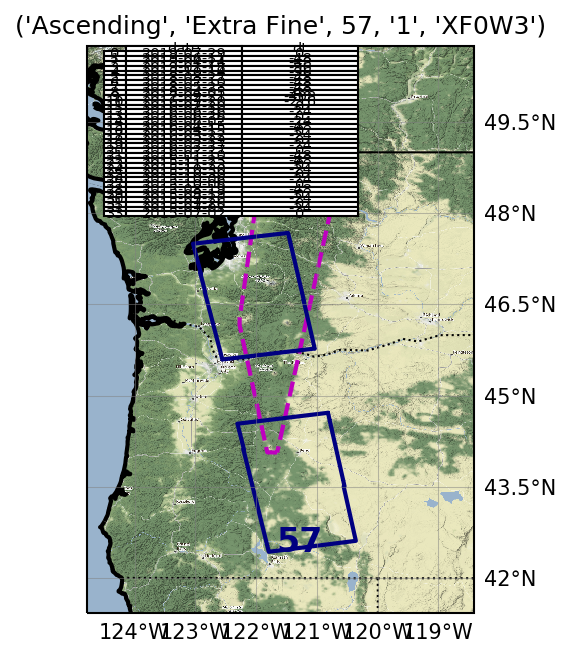

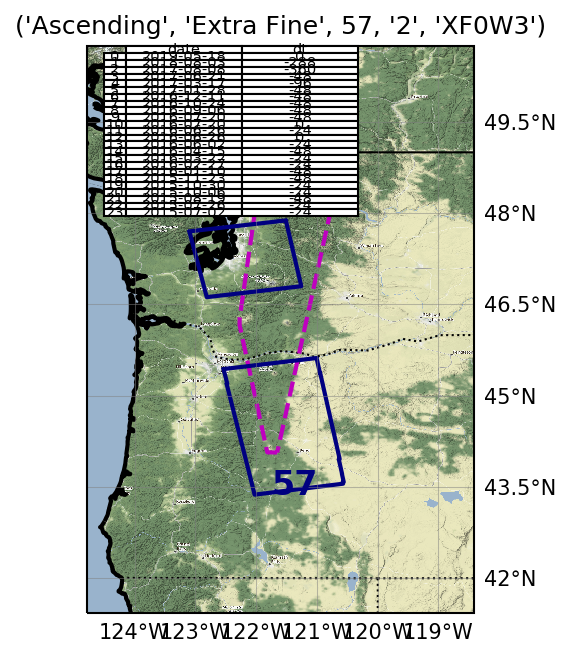

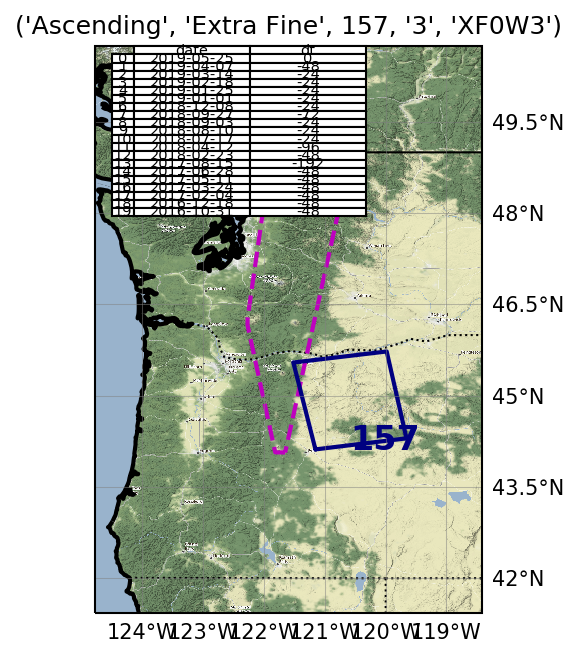

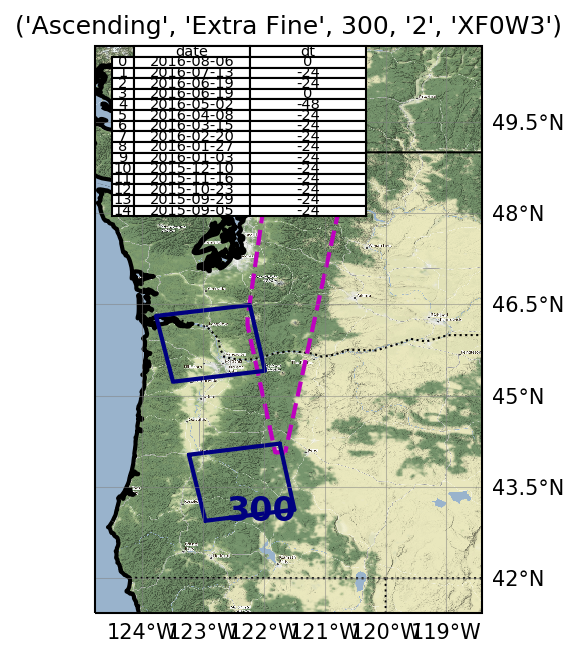

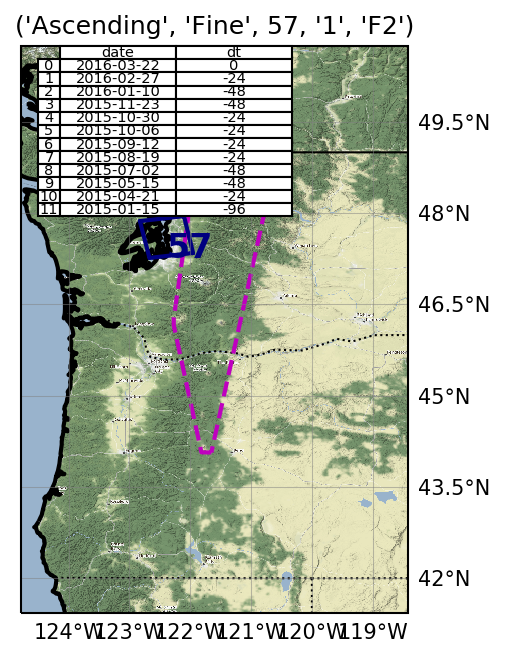

...

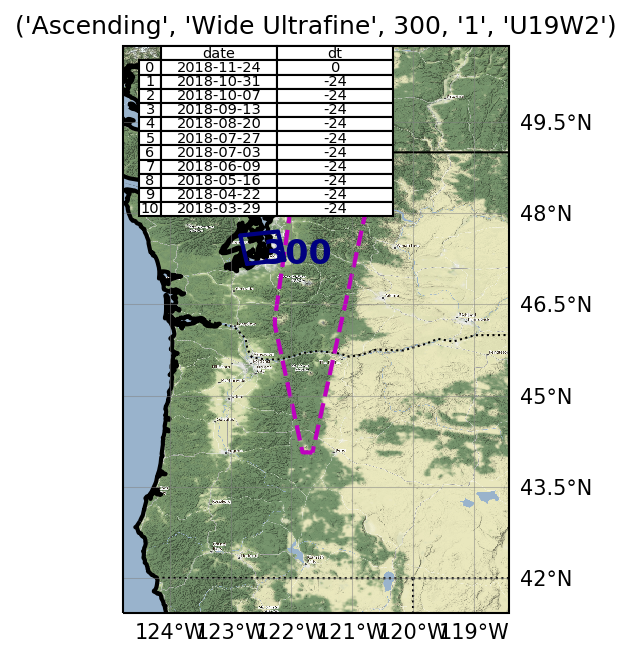

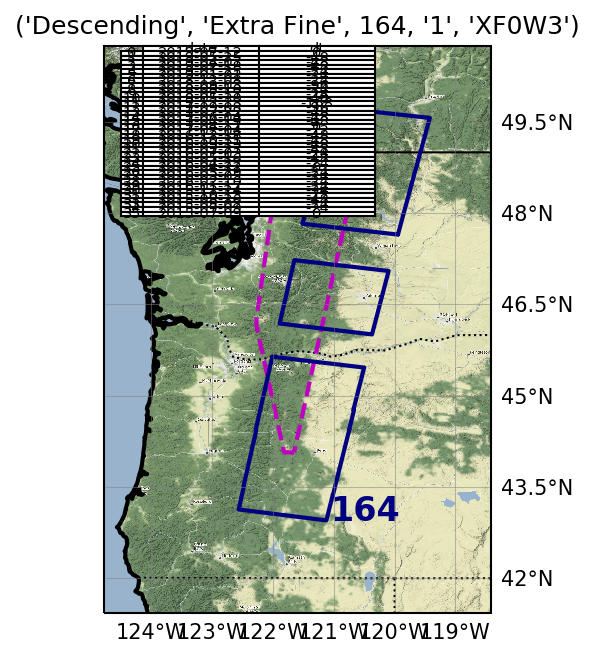

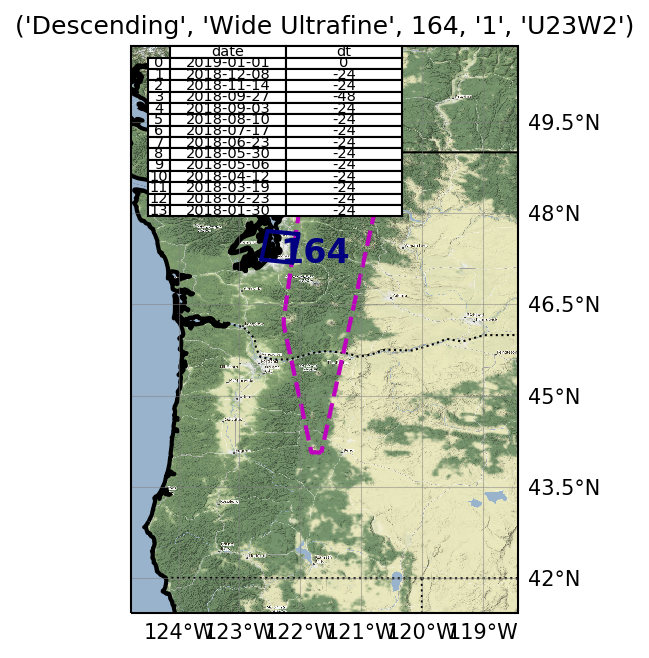

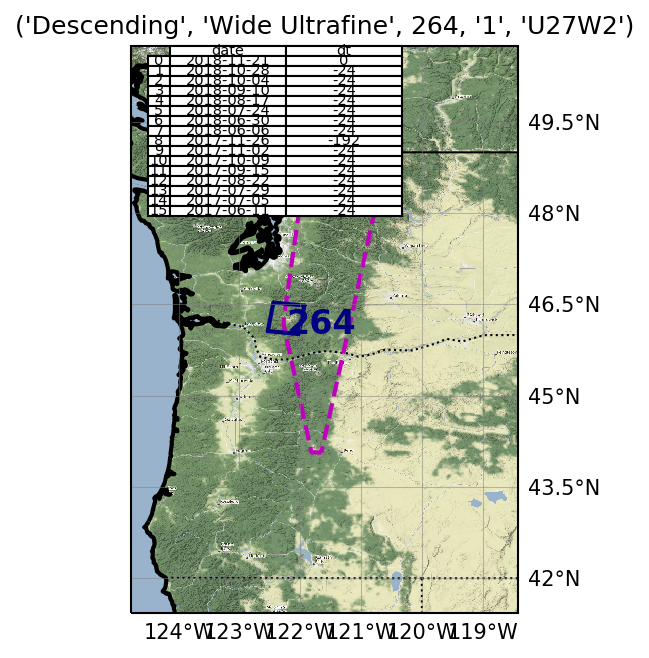

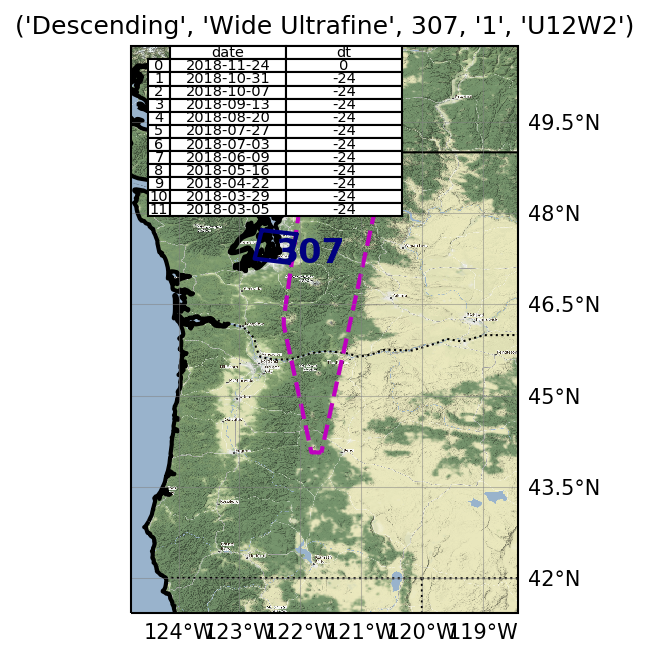

In [56]:
# Print maps for all combinations of possible interferometric pairs!
for labels, indices in GB.groups.items():
    #print(labels, indices)
    #print(labels, DF.loc[indices, "Scene ID"].tolist())
    inventory = GF.loc[indices]
    tmp = print_dates(inventory)
    plot_map(inventory, snwe, vectorFile, title=str(labels), tableFrame=tmp)

In [57]:
def print_inventory(GF):
    ''' print list of dates from dataframe'''
    tmp = GF.loc[:, ['sceneId','sceneDate']].reset_index(drop=True)
    tmp.loc[:, 'timeStamp'] = pd.to_datetime(tmp.sceneDate)
    tmp['date'] = tmp.sceneDate.str[:10]
    timeDeltas = tmp.timeStamp.diff()
    tmp['dt'] = timeDeltas.dt.days
    tmp.loc[0, 'dt'] = 0
    tmp['dt'] = tmp.dt.astype('i2')
    return tmp.loc[:, ['sceneId','date','dt']]

In [58]:
print_inventory(inventory)

,sceneId,date,dt
0,682820,2018-11-24,0
1,677201,2018-10-31,-24
2,671565,2018-10-07,-24
3,665827,2018-09-13,-24
4,659991,2018-08-20,-24
5,654489,2018-07-27,-24
6,648899,2018-07-03,-24
7,643216,2018-06-09,-24
8,637654,2018-05-16,-24
9,632246,2018-04-22,-24


In [59]:
# Forecast inventory based on 24 day increments
# Forecast upcoming acquisistion dates!
start = pd.to_datetime(inventory.sceneDate.iloc[0])
R = np.arange(5)
[start+x*pd.Timedelta(24,'D') for x in R]

[Timestamp('2018-11-24 00:00:00'),
 Timestamp('2018-12-18 00:00:00'),
 Timestamp('2019-01-11 00:00:00'),
 Timestamp('2019-02-04 00:00:00'),
 Timestamp('2019-02-28 00:00:00')]